In [1]:
from encodec import EncodecModel

In [3]:
model = EncodecModel.encodec_model_48khz()
model.set_target_bandwidth(6.0)  # kbps

import torch, torchaudio

wav, sr = torchaudio.load("../../datasetv2/live/Circadian Rhythm.mp3")
wav = torchaudio.functional.resample(wav, sr, 48000)
wav = wav.unsqueeze(0)  # (1, channels, samples)

with torch.no_grad():
    encoded_frames = model.encode(wav)
    reconstructed = model.decode(encoded_frames)

In [8]:
codes = torch.cat([frame[0] for frame in encoded_frames], dim=-1)  # (batch, codebooks, time)

print("Number of encoded frames:", len(encoded_frames))
print("Codes tensor shape:", codes.shape)          # (1, n_codebooks, T)
print("Reconstructed audio shape:", reconstructed.shape)  # (1, channels, samples)

Number of encoded frames: 67
Codes tensor shape: torch.Size([1, 4, 9926])
Reconstructed audio shape: torch.Size([1, 2, 3144640])


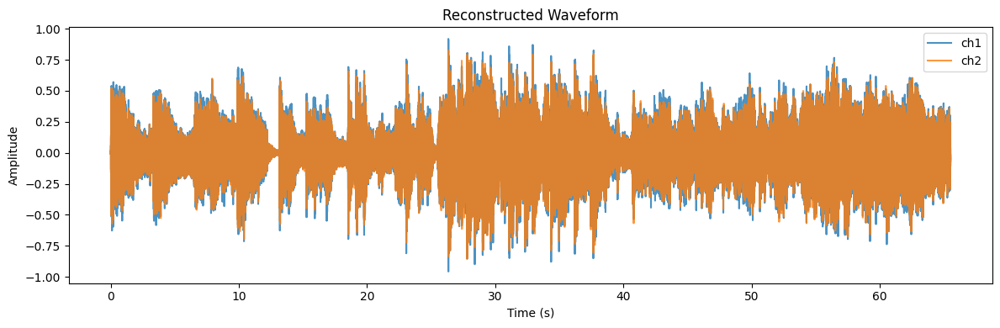

In [5]:
from IPython.display import Audio, display
import matplotlib.pyplot as plt

rec = reconstructed.squeeze(0).detach().cpu()  # (channels, samples)

t = torch.arange(rec.shape[-1]) / sr
plt.figure(figsize=(12, 4))
for ch in range(rec.shape[0]):
    plt.plot(t, rec[ch], label=f"ch{ch+1}", alpha=0.8)
plt.title("Reconstructed Waveform")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.legend()
plt.tight_layout()
plt.show()

display(Audio(rec.numpy(), rate=sr))